In [1]:
import pymn
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import anndata as ad
import numpy as np
import itertools
import scipy.stats
import seaborn as sns
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)


In [2]:
norm_data = sc.read_h5ad('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/unintegrated_data_fast.h5ad')


In [3]:
norm_data.var['ZM'] = norm_data.var_names.str.startswith('Zm')
norm_data = norm_data[:, norm_data.var['ZM'] == True] 
norm_data.var#

,ZM
Zm00001d027230,True
Zm00001d027231,True
Zm00001d027236,True
Zm00001d027239,True
Zm00001d027240,True
...,...
Zm00001d033266,True
Zm00001d032469,True
Zm00001d029568,True
Zm00001d047419,True


In [4]:
cell_identity = pd.read_csv('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/Meta_Maize_Sorghum_Setaria_Nuclei_Cells_SCT_OrthologousgenesGoodname_Sept2022.csv',index_col = 0)
norm_data.obs = cell_identity

In [5]:
norm_data.obs = norm_data.obs.rename(columns = {'orig.ident':'Batch','Annotation':'Cell Cluster Annotation','type':'Type'})

In [6]:
nuclei_only_data = norm_data[norm_data.obs['Type'] == 'Nucl',:]
nuclei_only_data = nuclei_only_data.copy()

In [7]:
nuclei_only_data

AnnData object with n_obs × n_vars = 29068 × 29539
    obs: 'Batch', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.6', 'seurat_clusters', 'Species', 'Cell Cluster Annotation', 'Type'
    var: 'ZM'

In [8]:
sc.pp.filter_genes(nuclei_only_data, min_cells=10)

filtered out 7103 genes that are detected in less than 10 cells


In [9]:
sc.pp.filter_cells(nuclei_only_data, min_genes=850)


filtered out 21526 cells that have less than 850 genes expressed


In [10]:
nuclei_only_data.obs

,Batch,nCount_RNA,nFeature_RNA,nCount_SCT,nFeature_SCT,integrated_snn_res.0.6,seurat_clusters,Species,Cell Cluster Annotation,Type,n_genes
Maize_Nucl1_AAAGAACAGGTTGTTC,Maize_Nucl1,2971,1973,3192,1973,0,0,Maize,Stele_1,Nucl,1963
Maize_Nucl1_AACAAGACAGGCACAA,Maize_Nucl1,3620,2363,3620,2363,11,11,Maize,Pericycle,Nucl,2346
Maize_Nucl1_AATCACGAGCGATCGA,Maize_Nucl1,9311,4202,4741,3343,9,9,Maize,Young_Stele_2,Nucl,4178
Maize_Nucl1_ACTATTCTCCTCTGCA,Maize_Nucl1,4472,2629,4121,2629,9,9,Maize,Young_Stele_2,Nucl,2590
Maize_Nucl1_AGATAGAAGGATATGT,Maize_Nucl1,8026,3804,4722,3299,0,0,Maize,Stele_1,Nucl,3778
...,...,...,...,...,...,...,...,...,...,...,...
Set_Nuclei_2_CATACAGCAGCTGAGA-1,Set_Nuclei_2,4773,2517,3276,2374,10,10,Setaria,Endodermis,Nucl,1015
Set_Nuclei_2_CGAATTGTCATCCCGT-1,Set_Nuclei_2,3307,2019,2996,2004,10,10,Setaria,Endodermis,Nucl,854
Set_Nuclei_2_GATGAGGAGATGCCGA-1,Set_Nuclei_2,4305,2543,3272,2454,10,10,Setaria,Endodermis,Nucl,1038
Set_Nuclei_2_GTTGTGAGTCCTCATC-1,Set_Nuclei_2,5941,2887,3461,2490,11,11,Setaria,Pericycle,Nucl,1189


<AxesSubplot:xlabel='n_genes', ylabel='Count'>

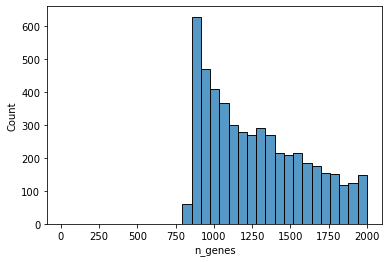

In [11]:
sns.histplot(x = nuclei_only_data.obs['n_genes'], binrange = (10,2000))

In [12]:
sc.pp.calculate_qc_metrics(nuclei_only_data, percent_top=None, log1p=False, inplace=True, qc_vars= ['ZM'])


In [13]:
nuclei_only_data

AnnData object with n_obs × n_vars = 7542 × 22436
    obs: 'Batch', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.6', 'seurat_clusters', 'Species', 'Cell Cluster Annotation', 'Type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_ZM', 'pct_counts_ZM'
    var: 'ZM', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

In [14]:
sc.pp.log1p(nuclei_only_data)

In [15]:
nuclei_only_data.X

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.6931472, 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [16]:
nuclei_only_data.X = scipy.sparse.csr_matrix(nuclei_only_data.X)

In [17]:
nuclei_only_data

AnnData object with n_obs × n_vars = 7542 × 22436
    obs: 'Batch', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.6', 'seurat_clusters', 'Species', 'Cell Cluster Annotation', 'Type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_ZM', 'pct_counts_ZM'
    var: 'ZM', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'

In [18]:
nuclei_only_data.obs

,Batch,nCount_RNA,nFeature_RNA,nCount_SCT,nFeature_SCT,integrated_snn_res.0.6,seurat_clusters,Species,Cell Cluster Annotation,Type,n_genes,n_genes_by_counts,total_counts,total_counts_ZM,pct_counts_ZM
Maize_Nucl1_AAAGAACAGGTTGTTC,Maize_Nucl1,2971,1973,3192,1973,0,0,Maize,Stele_1,Nucl,1963,1963,2959.0,2959.0,100.0
Maize_Nucl1_AACAAGACAGGCACAA,Maize_Nucl1,3620,2363,3620,2363,11,11,Maize,Pericycle,Nucl,2346,2346,3593.0,3593.0,100.0
Maize_Nucl1_AATCACGAGCGATCGA,Maize_Nucl1,9311,4202,4741,3343,9,9,Maize,Young_Stele_2,Nucl,4178,4178,9255.0,9255.0,100.0
Maize_Nucl1_ACTATTCTCCTCTGCA,Maize_Nucl1,4472,2629,4121,2629,9,9,Maize,Young_Stele_2,Nucl,2590,2590,4386.0,4386.0,100.0
Maize_Nucl1_AGATAGAAGGATATGT,Maize_Nucl1,8026,3804,4722,3299,0,0,Maize,Stele_1,Nucl,3778,3778,7973.0,7973.0,100.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Set_Nuclei_2_CATACAGCAGCTGAGA-1,Set_Nuclei_2,4773,2517,3276,2374,10,10,Setaria,Endodermis,Nucl,1015,1015,1644.0,1644.0,100.0
Set_Nuclei_2_CGAATTGTCATCCCGT-1,Set_Nuclei_2,3307,2019,2996,2004,10,10,Setaria,Endodermis,Nucl,854,854,1167.0,1167.0,100.0
Set_Nuclei_2_GATGAGGAGATGCCGA-1,Set_Nuclei_2,4305,2543,3272,2454,10,10,Setaria,Endodermis,Nucl,1038,1038,1556.0,1556.0,100.0
Set_Nuclei_2_GTTGTGAGTCCTCATC-1,Set_Nuclei_2,5941,2887,3461,2490,11,11,Setaria,Pericycle,Nucl,1189,1189,1992.0,1992.0,100.0


In [19]:
sc.pp.highly_variable_genes(nuclei_only_data, min_mean=0.0125, max_mean=3, min_disp=0.4, batch_key = 'Batch')

extracting highly variable genes


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/

    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:478: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)


In [20]:
nuclei_only_data.var['highly_variable_nbatches'].value_counts()

0    9250
1    6105
2    3529
3    1840
4     952
5     362
6     201
7     109
8      56
9      32
Name: highly_variable_nbatches, dtype: int64

In [21]:
highly_variable_genes_across_batches  = nuclei_only_data.var['highly_variable_nbatches']>1
nuclei_only_data.var['highly_variable'].loc[highly_variable_genes_across_batches] = True
high_var_list = nuclei_only_data.var.loc[highly_variable_genes_across_batches].index.to_list()


/tmp/ipykernel_3028907/3431686561.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nuclei_only_data.var['highly_variable'].loc[highly_variable_genes_across_batches] = True


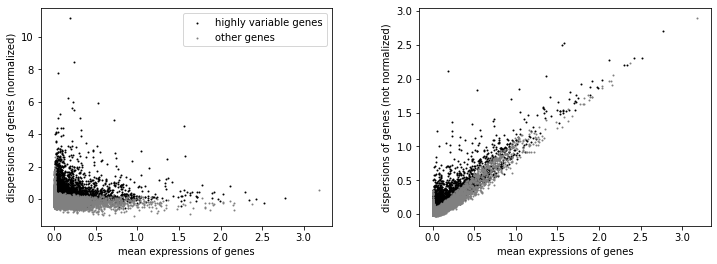

In [22]:
sc.pl.highly_variable_genes(nuclei_only_data)

In [23]:
nuclei_only_data.raw = nuclei_only_data

In [24]:
#sc.pp.regress_out(nuclei_only_data, ['total_counts'])


In [25]:
sc.pp.scale(nuclei_only_data, max_value=10)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [26]:
sc.tl.pca(nuclei_only_data, svd_solver='arpack')
sc.pp.neighbors(nuclei_only_data, n_neighbors=10, n_pcs=40)
sc.tl.umap(nuclei_only_data)
sc.tl.leiden(nuclei_only_data)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [27]:
sc.set_figure_params(figsize = (15,15),facecolor = 'white')

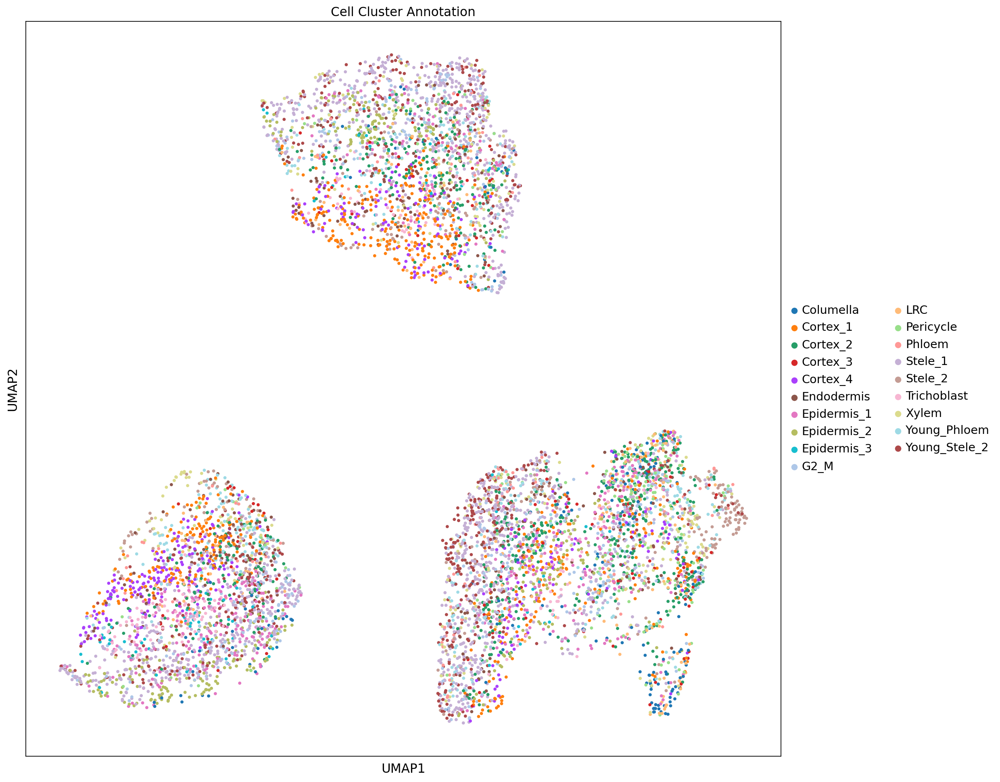

In [28]:
sc.pl.umap(nuclei_only_data, color=['Cell Cluster Annotation'], s = 50)

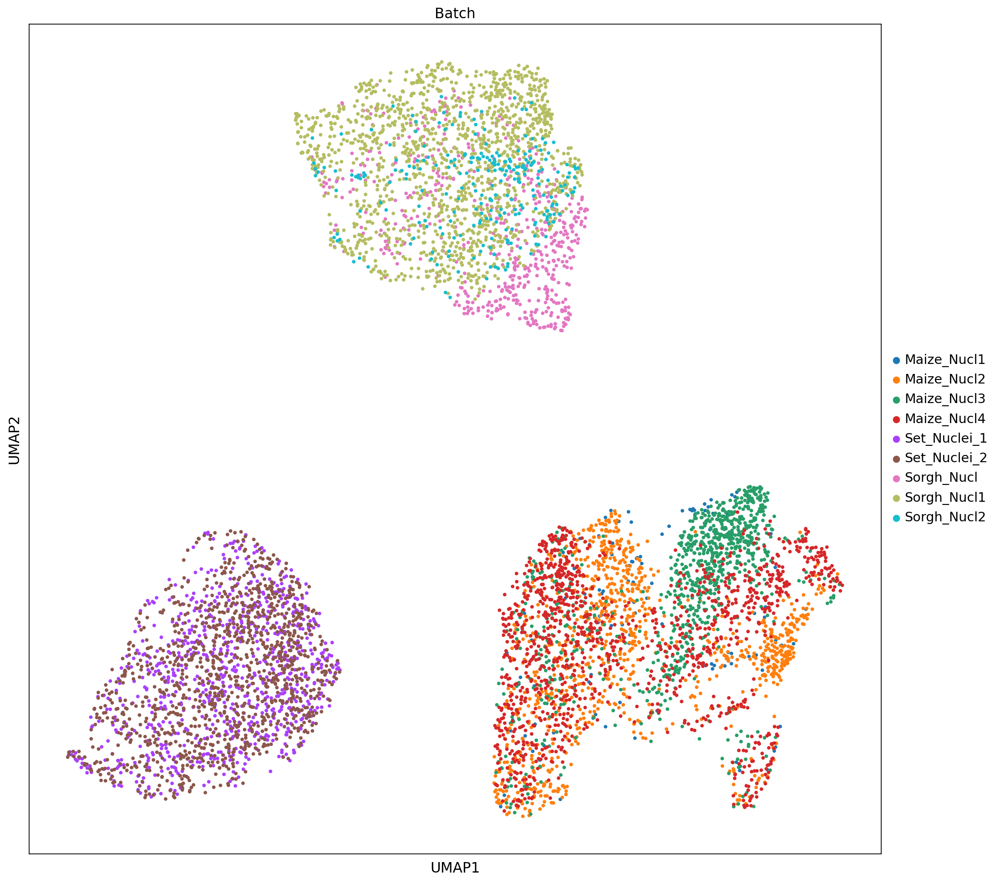

In [29]:
sc.pl.umap(nuclei_only_data, color=['Batch'], s = 50)

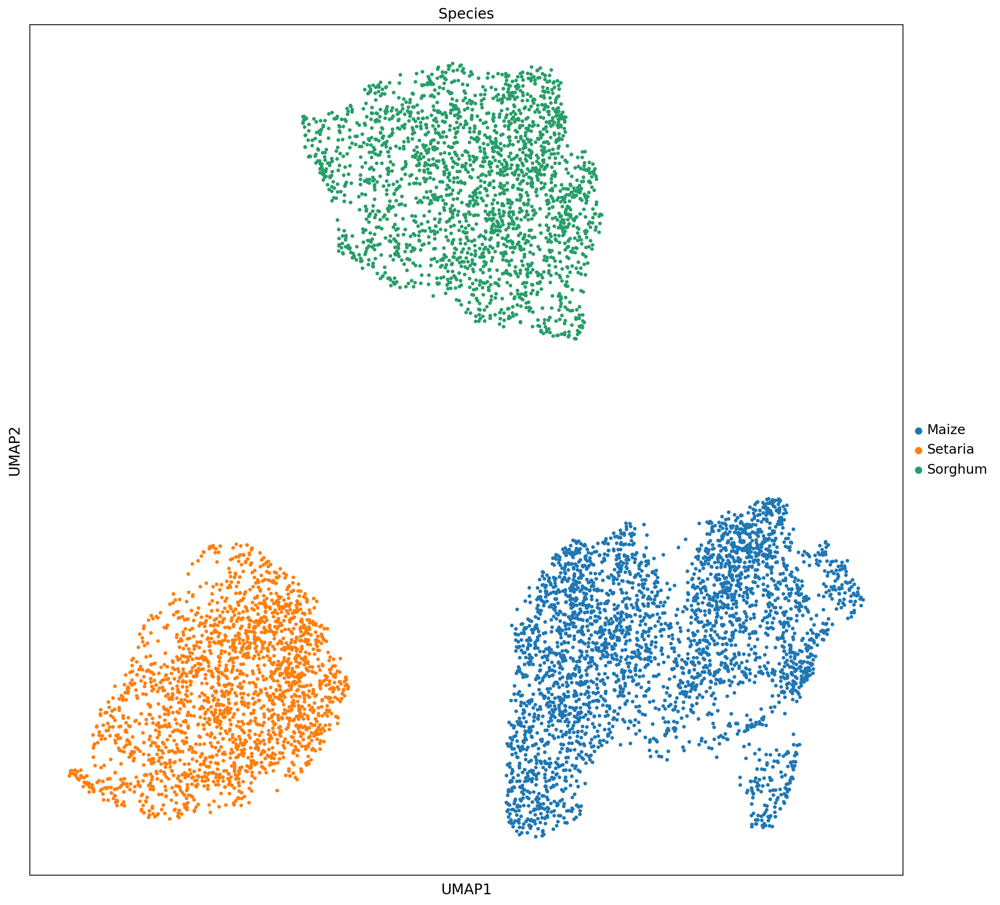

In [30]:
sc.pl.umap(nuclei_only_data, color=['Species'], s = 50)

In [ ]:
nuclei_only_maize = nuclei_only_data[nuclei_only_data.obs['Species'] == 'Maize',:]
nuclei_only_set = nuclei_only_data[nuclei_only_data.obs['Species'] == 'Setaria',:]
nuclei_only_sorg = nuclei_only_data[nuclei_only_data.obs['Species'] == 'Sorghum',:]

In [ ]:
sc.tl.pca(nuclei_only_sorg, svd_solver='arpack')
sc.pp.neighbors(nuclei_only_sorg, n_neighbors=15, n_pcs=40)
sc.tl.umap(nuclei_only_sorg)
sc.tl.leiden(nuclei_only_sorg)

In [ ]:
sc.pl.umap(nuclei_only_sorg, color=['Cell Cluster Annotation'], s = 100)

In [ ]:
sc.pl.umap(nuclei_only_sorg, color=['Batch'], s = 100)

In [ ]:
sc.tl.pca(nuclei_only_maize, svd_solver='arpack')
sc.pp.neighbors(nuclei_only_maize, n_neighbors=15, n_pcs=40)
sc.tl.umap(nuclei_only_maize)
sc.tl.leiden(nuclei_only_maize)

In [ ]:
sc.pl.umap(nuclei_only_maize, color=['Cell Cluster Annotation'], s = 100)

In [ ]:
sc.pl.umap(nuclei_only_maize, color=['Batch'], s = 50)

In [ ]:
sc.tl.pca(nuclei_only_set, svd_solver='arpack')
sc.pp.neighbors(nuclei_only_set, n_neighbors=15, n_pcs=40)
sc.tl.umap(nuclei_only_set)
sc.tl.leiden(nuclei_only_set)

In [ ]:
sc.pl.umap(nuclei_only_set, color=['Cell Cluster Annotation'], s = 100)

In [ ]:
sc.pl.umap(nuclei_only_set, color=['Batch'], s = 50)

In [ ]:
import scgen
scgen.SCGEN.setup_anndata(nuclei_only_maize, batch_key="Batch", labels_key="Cell Cluster Annotation")

model2 = scgen.SCGEN(nuclei_only_maize)
model2.train(
    max_epochs=150,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=7,
)

In [ ]:
nuclei_only_maize = model2.batch_removal()
nuclei_only_maize

In [ ]:
sc.pp.neighbors(nuclei_only_maize)
sc.tl.umap(nuclei_only_maize)

In [ ]:
sc.pl.umap(nuclei_only_maize, color=['Cell Cluster Annotation'], s = 50)

In [ ]:
sc.pl.umap(nuclei_only_maize, color=['Batch'], s = 50)

In [31]:
import scgen
scgen.SCGEN.setup_anndata(nuclei_only_data, batch_key="Species", labels_key="Cell Cluster Annotation")

model2 = scgen.SCGEN(nuclei_only_data)
model2.train(
    max_epochs=150,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=15,
)

Global seed set to 0
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/scvi/model/base/_training_mixin.py:67: UserWarning: max_epochs=150 is less than n_epochs_kl_warmup=400. The max_kl_weight w

Epoch 18/150:  12%|█▏        | 18/150 [05:45<42:12, 19.18s/it, loss=8.57e+03, v_num=1]
Monitored metric elbo_validation did not improve in the last 15 records. Best score: 18350.842. Signaling Trainer to stop.


In [32]:
corrected_adata = model2.batch_removal()
corrected_adata

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


AnnData object with n_obs × n_vars = 7542 × 22436
    obs: 'Batch', 'nCount_RNA', 'nFeature_RNA', 'nCount_SCT', 'nFeature_SCT', 'integrated_snn_res.0.6', 'seurat_clusters', 'Species', 'Cell Cluster Annotation', 'Type', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_ZM', 'pct_counts_ZM', 'leiden', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'latent', 'corrected_latent'

In [33]:
sc.pp.neighbors(corrected_adata)
sc.tl.umap(corrected_adata)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:04)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


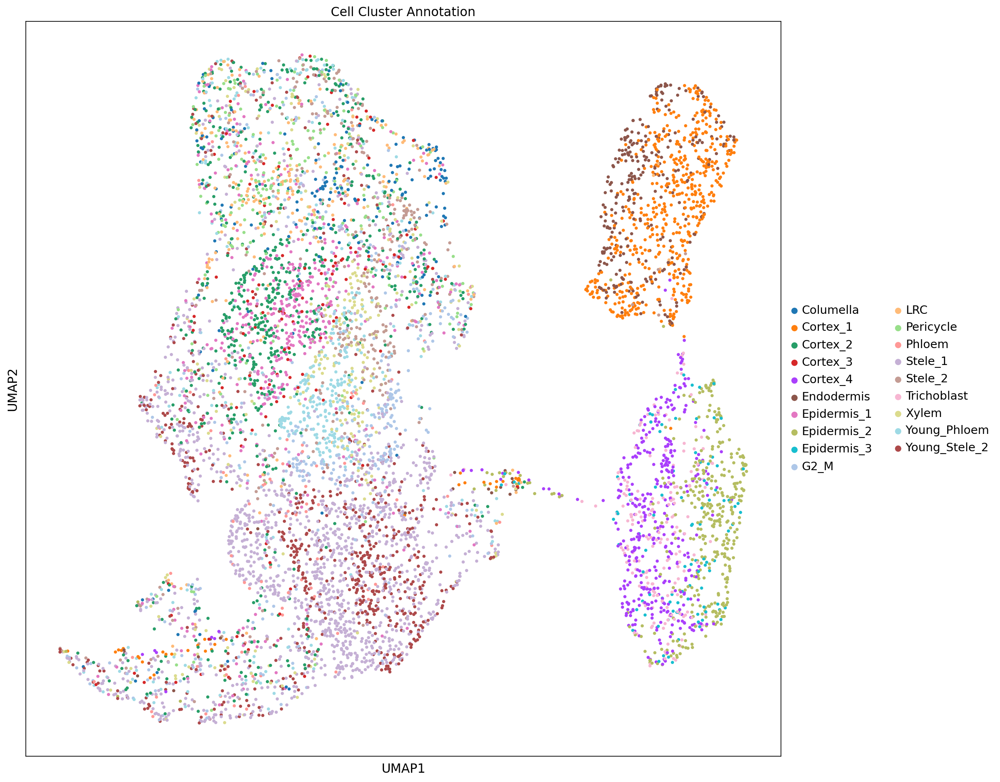

In [34]:
sc.pl.umap(corrected_adata, color=['Cell Cluster Annotation'], s = 50)

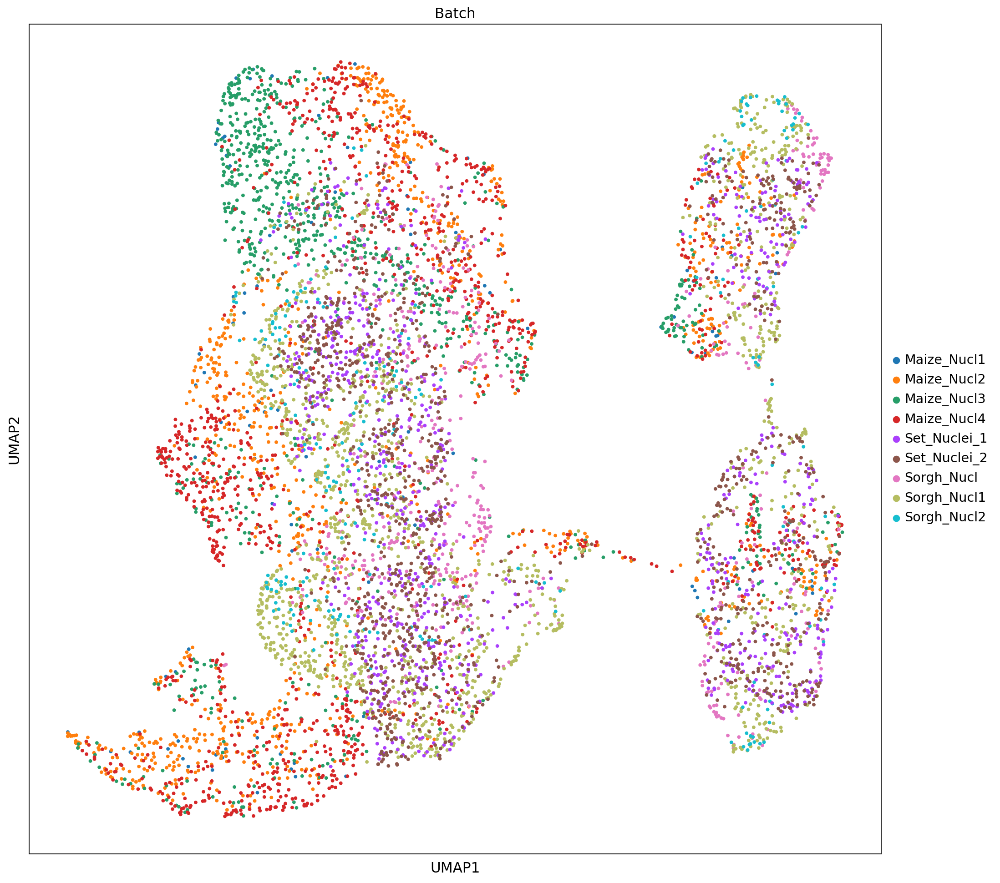

In [35]:
sc.pl.umap(corrected_adata, color=['Batch'], s = 50)

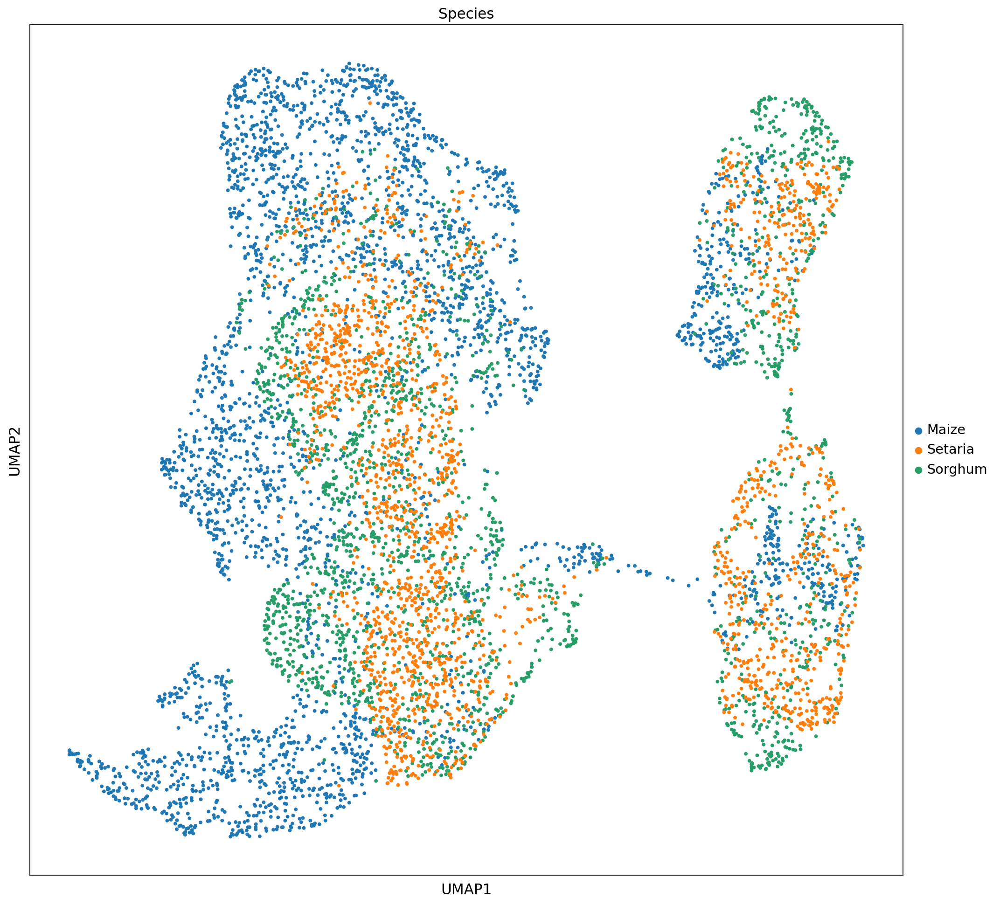

In [36]:
sc.pl.umap(corrected_adata, color=['Species'], s = 50)

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


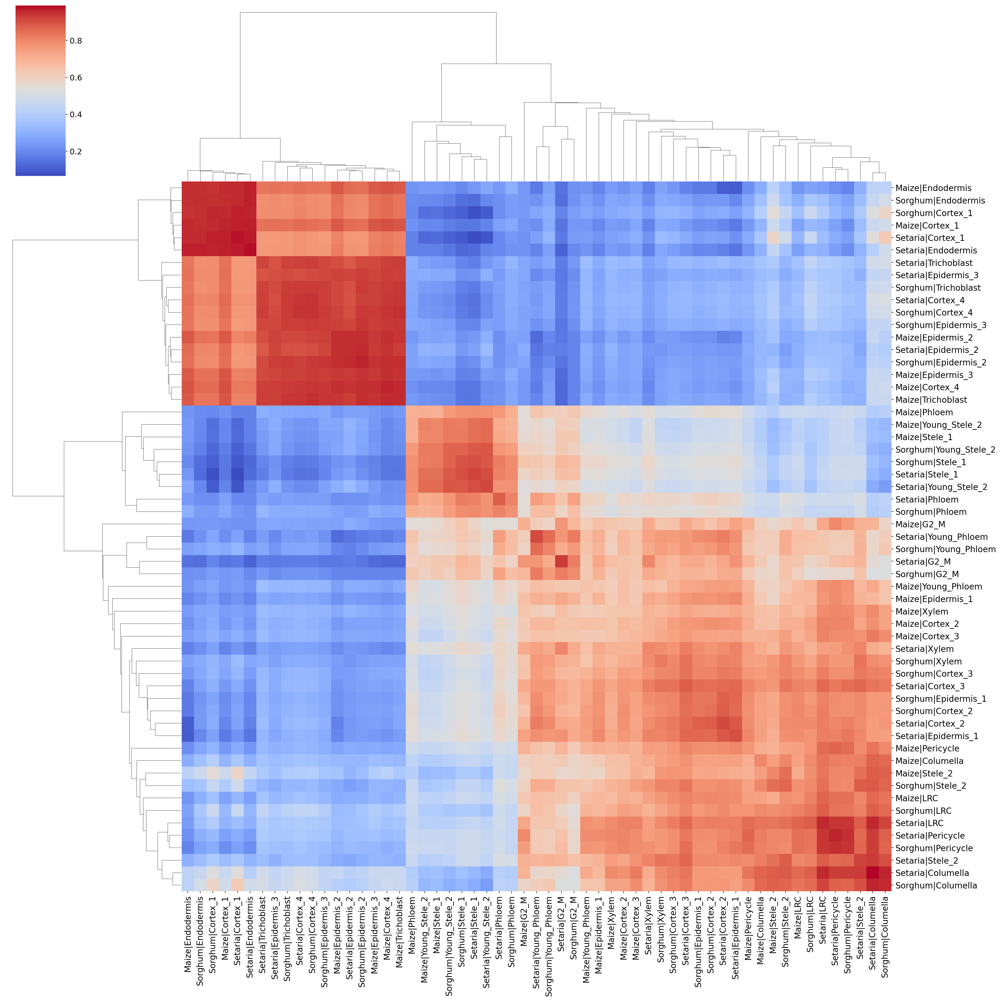

In [47]:
pymn.variableGenes(corrected_adata,study_col = 'Species')
pymn.MetaNeighborUS(corrected_adata,study_col = 'Species',ct_col = 'Cell Cluster Annotation', compute_p= True)
g = pymn.plotMetaNeighborUS(corrected_adata,figsize = (25,25),fontsize = 15,show = False,cbar_pos = (0.02,0.82,0.05,0.17), cmap = 'coolwarm')
#g.savefig('/d/different_integration_method_metaneighbor_redo.svg')

In [37]:
import scanorama
#sc.tl.pca(concatenated_alpha_beta_database, svd_solver='arpack', )

sc.external.pp.scanorama_integrate(nuclei_only_data,'Batch')
sc.pp.neighbors(nuclei_only_data, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 23)
sc.tl.umap(nuclei_only_data, random_state= 567)


[[0.         0.97345133 0.47787611 0.43362832 0.         0.
  0.         0.         0.        ]
 [0.         0.         0.80344478 0.81864235 0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.90814696 0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.13011152 0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.85315985
  0.23137255 0.00185874 0.        ]
 [0.         0.         0.         0.         0.         0.
  1.         0.0192582  0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.43921569 0.        ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.99881797]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]]
Processing datasets Sorgh_Nucl1 <=> Sorgh_Nucl2
Processing datasets Set_Nuclei_1 <=> Set_Nuclei_2
Processing datasets Maize_Nuc

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


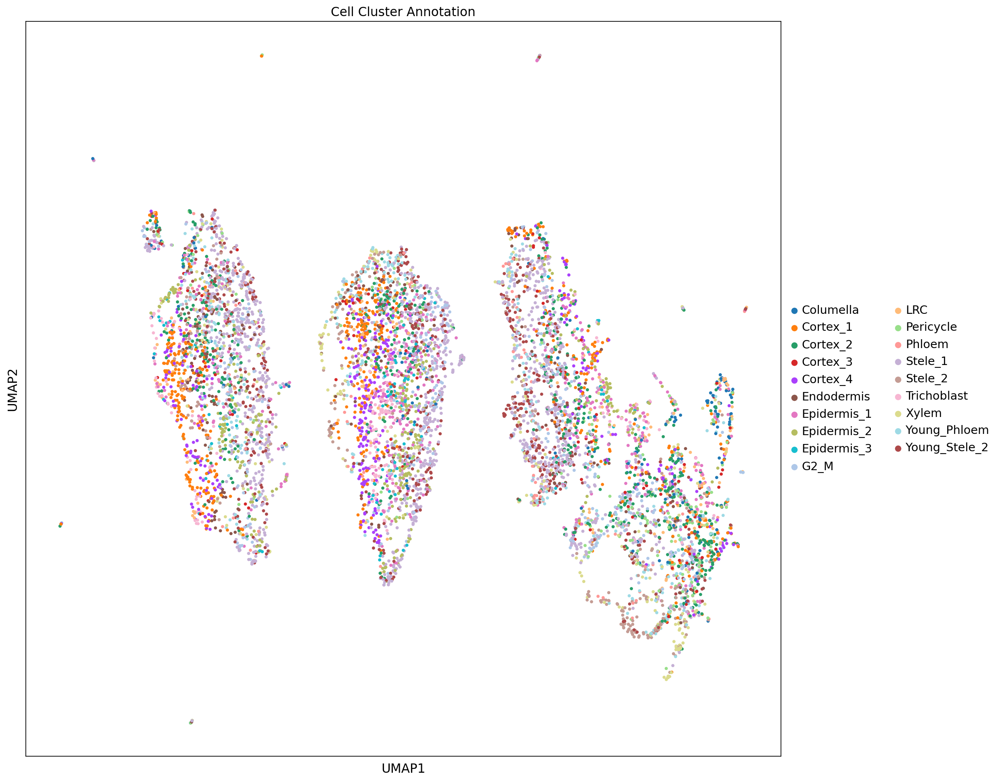

In [38]:
sc.pl.umap(nuclei_only_data, color=['Cell Cluster Annotation'], s = 50)

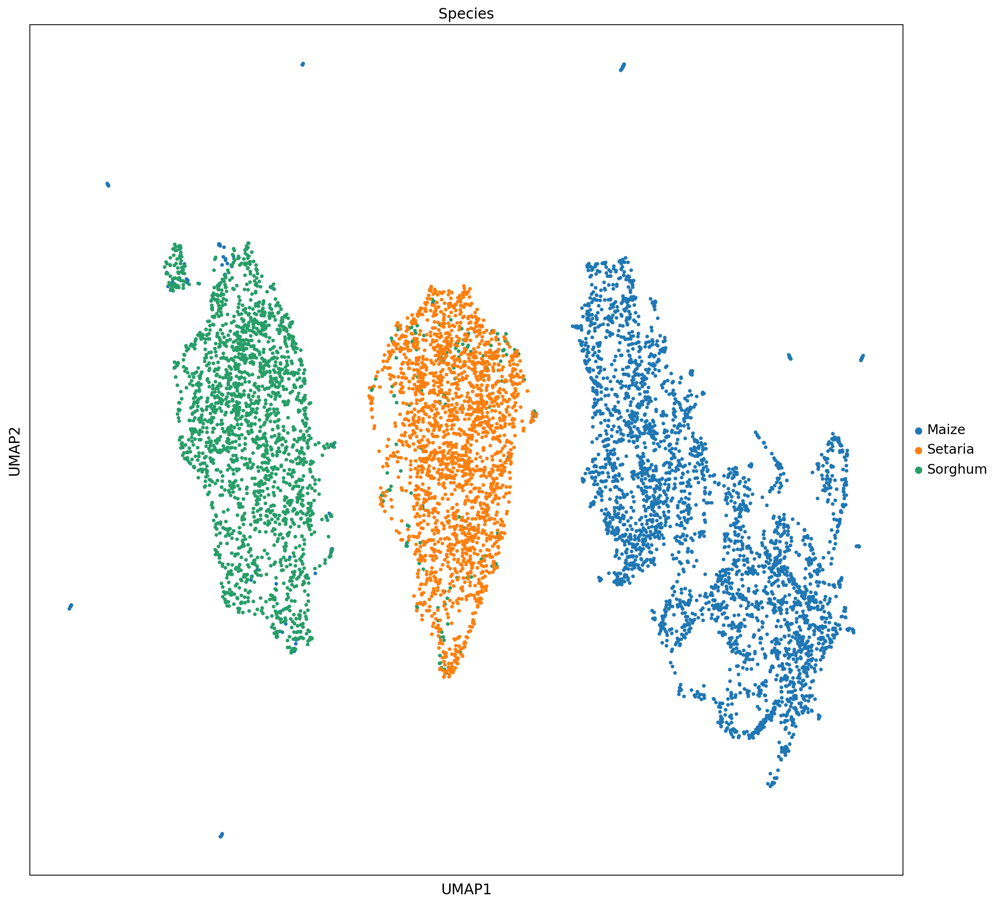

In [39]:
sc.pl.umap(nuclei_only_data, color=['Species'], s = 50)

In [40]:
sc.external.pp.scanorama_integrate(nuclei_only_data,'Species')
sc.pp.neighbors(nuclei_only_data, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 502)
sc.tl.umap(nuclei_only_data, random_state= 34)

[[0.         0.16628702 0.        ]
 [0.         0.         0.57175399]
 [0.         0.         0.        ]]
Processing datasets Sorghum <=> Setaria
Processing datasets Maize <=> Sorghum
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


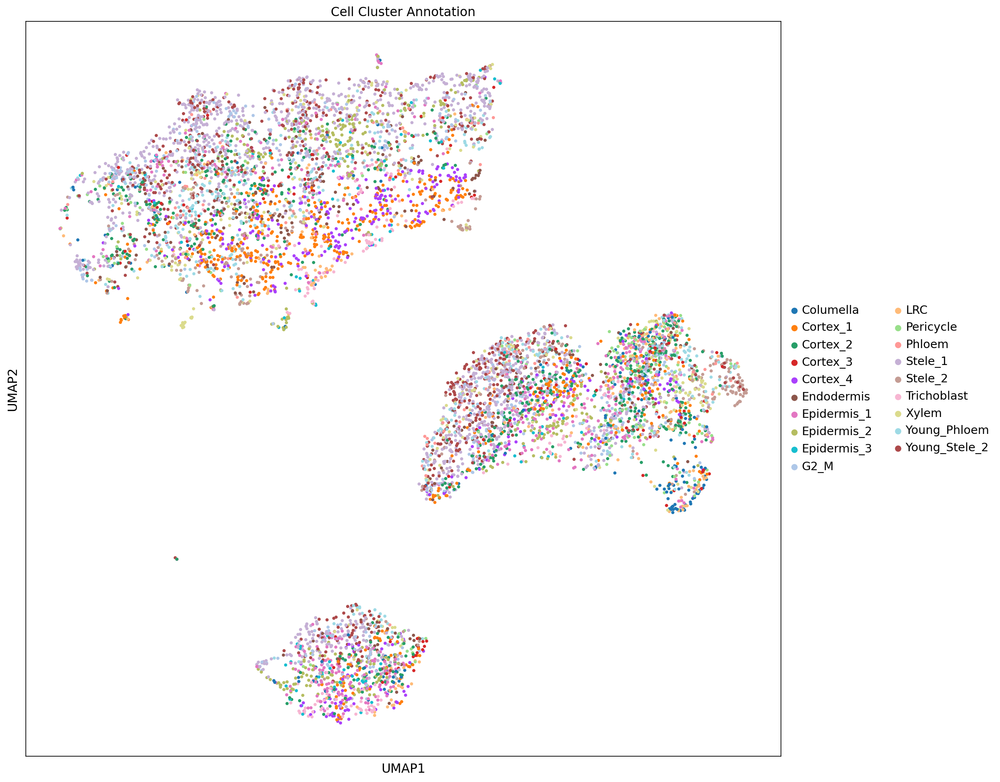

In [41]:
sc.pl.umap(nuclei_only_data, color=['Cell Cluster Annotation'], s = 50)

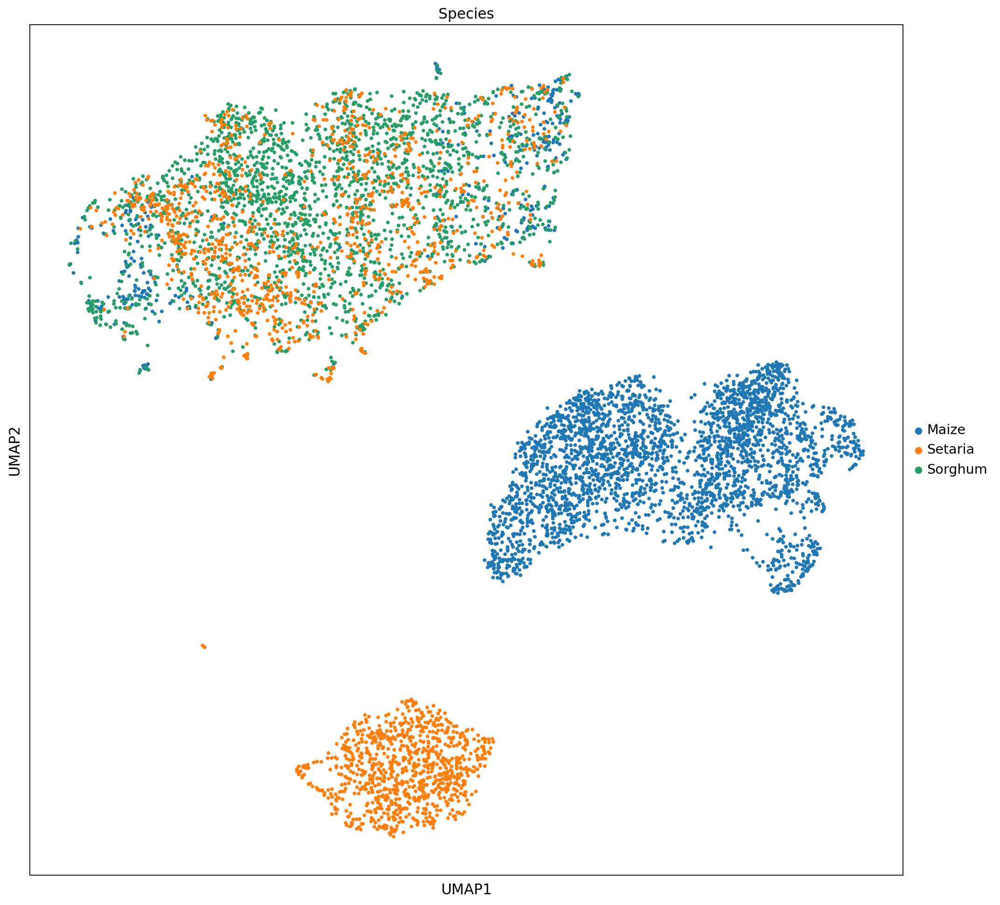

In [42]:
sc.pl.umap(nuclei_only_data, color=['Species'], s = 50)

In [43]:
sc.external.pp.scanorama_integrate(corrected_adata,'Species')
sc.pp.neighbors(corrected_adata, n_neighbors = 10, n_pcs = 40, use_rep= 'X_scanorama', random_state = 502)
sc.tl.umap(corrected_adata, random_state= 34)

[[0.         0.70797267 0.48151751]
 [0.         0.         0.92023346]
 [0.         0.         0.        ]]
Processing datasets Sorghum <=> Setaria
Processing datasets Maize <=> Sorghum
Processing datasets Maize <=> Setaria
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP


/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:259: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


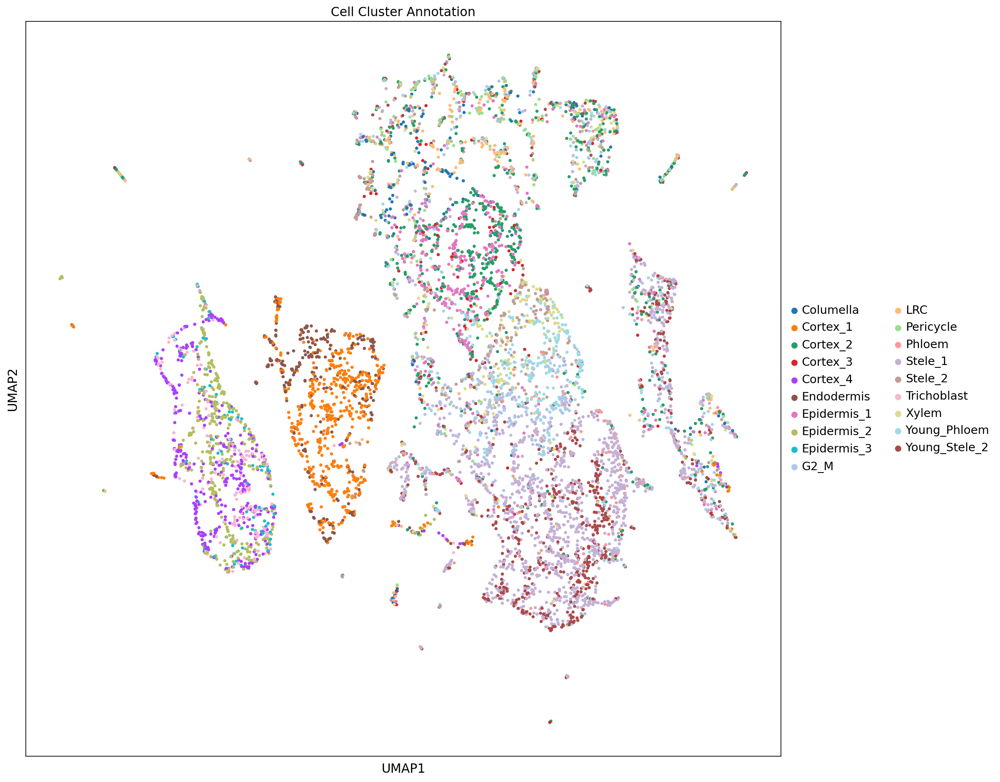

In [44]:
sc.pl.umap(corrected_adata, color=['Cell Cluster Annotation'], s = 50)

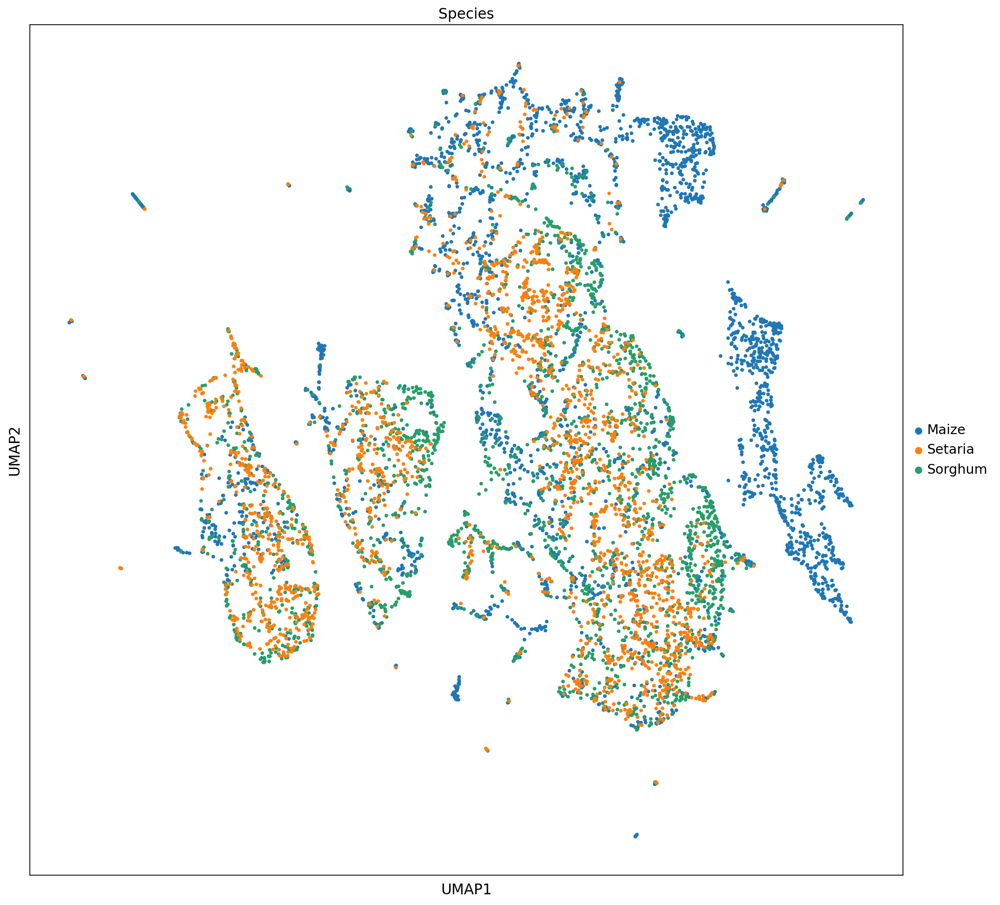

In [45]:
sc.pl.umap(corrected_adata, color=['Species'], s = 50)